### Data

The Dataset chosen was : https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation?datasetId=181273 .

Given Dataset contains Brain tumour segmentation multimodal scans which are in TIF file format and describe different volumes like 
1. Native image
2. Tumour Segmented image

General umour annotations comprise of : 
1. necrotic and non-enhancing tumor core (NCR/NET — label 1)
2. peritumoral edema (ED — label 2)
3. GD-enhancing tumor (ET — label 4)

### Formulation :
+ Each pixel must be labeled “1” if it is part of a tumour , and “0” if not.

### Solution
+ Unet will be used for automatic segmentation / mask generation using TensorFlow library



# Importing libraries

In [5]:
import time
# Code wall time starts( cw0 ) 
cw0 = time.time() 

In [6]:
import os
import time
import random
import pathlib
import itertools
from glob import glob
from tqdm import tqdm_notebook, tnrange
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.color import rgb2gray
from skimage.morphology import label
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from skimage.io import imread, imshow, concatenate_images
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler

# Data loading

In [7]:
# data pre-processing time starts(dpp0)
dpp0 = time.time() 

In [8]:
data_dir = '/kaggle/input/lgg-mri-segmentation/kaggle_3m'
images_paths = []
masks_paths = glob(f'{data_dir}/*/*_mask*')

for i in masks_paths:
    images_paths.append(i.replace('_mask', ''))

df = pd.DataFrame(data= {'images_paths': images_paths, 'masks_paths': masks_paths})

In [9]:
def pos_neg_diagnosis(masks_paths):
    value = np.max(cv2.imread(masks_paths))
    if value > 0 : 
        return 1
    else:
        return 0
    
df['mask'] = df['masks_paths'].apply(lambda x: pos_neg_diagnosis(x))

In [10]:
brain_df_mask = df[df['mask'] == 1]

In [11]:
train_df, dummy_df = train_test_split(brain_df_mask, train_size= 0.8)

valid_df, test_df = train_test_split(dummy_df, train_size= 0.5)

In [12]:
tr_aug_dict = dict(rotation_range=0.2,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest')

In [13]:
# total data pre-processing time(dppt)
dpp1 = time.time() 
dppt = dpp1 - dpp0

# Data visualization

In [14]:
def create_gens(df, aug_dict):
    img_size = (256, 256)
    batch_size = 40

    img_gen = ImageDataGenerator(**aug_dict)
    msk_gen = ImageDataGenerator(**aug_dict)

    # Create general generator
    image_gen = img_gen.flow_from_dataframe(df, x_col='images_paths', class_mode=None, color_mode='rgb', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix='image', seed=1)

    mask_gen = msk_gen.flow_from_dataframe(df, x_col='masks_paths', class_mode=None, color_mode='grayscale', target_size=img_size,
                                            batch_size=batch_size, save_to_dir=None, save_prefix= 'mask', seed=1)

    gen = zip(image_gen, mask_gen)

    for (img, msk) in gen:
        img = img / 255
        msk = msk / 255
        msk[msk > 0.5] = 1
        msk[msk <= 0.5] = 0

        yield (img, msk)

In [15]:
# Temp time count
pp0 = time.time() 

In [16]:
train_gen = create_gens(train_df, aug_dict=tr_aug_dict)
valid_gen = create_gens(valid_df, aug_dict={})
test_gen = create_gens(test_df, aug_dict={})

In [17]:
# total Temp time count
pp1 = time.time() 
ppt = pp1 - pp0
dppt = dppt + ppt 

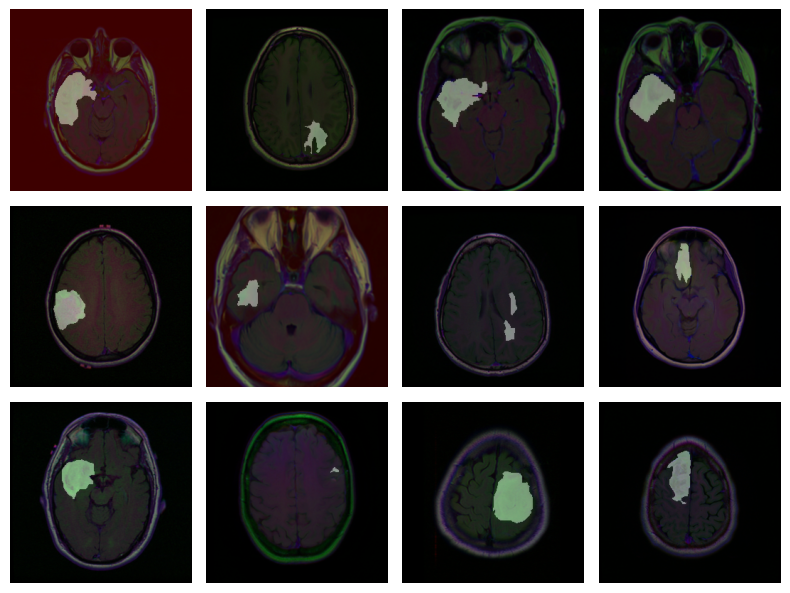

In [18]:
images=list(train_df['images_paths'])
masks=list(train_df['masks_paths'])
plt.figure(figsize=(8, 8))
for i in range(12):
    plt.subplot(4, 4, i+1)
    img_path = images[i]
    mask_path = masks[i]
        # read image and convert it to RGB scale
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # read mask
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    #mask[mask==255] = (255,0,0)
        # sho image and mask
    plt.imshow(image)
    plt.imshow(mask, alpha=.4)

    plt.axis('off')

plt.tight_layout()
plt.show()

# UNet architecture

In [19]:
def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # First DownConvolution / Encoder Leg will begin, so start with Conv2D
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation='relu')(inputs)
    conv11 = Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation='relu')(conv1)
    bn1 = BatchNormalization(axis=3)(conv11)
    bn1 = Activation("relu")(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same", activation='relu')(pool1)
    conv22 = Conv2D(filters=128, kernel_size=(3, 3), padding="same", activation='relu')(conv2)
    bn2 = BatchNormalization(axis=3)(conv22)
    bn2 = Activation("relu")(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same", activation='relu')(pool2)
    conv33 = Conv2D(filters=256, kernel_size=(3, 3), padding="same", activation='relu')(conv3)
    bn3 = BatchNormalization(axis=3)(conv33)
    bn3 = Activation("relu")(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same", activation='relu')(pool3)
    conv44 = Conv2D(filters=512, kernel_size=(3, 3), padding="same", activation='relu')(conv4)
    bn4 = BatchNormalization(axis=3)(conv44)
    bn4 = Activation("relu")(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same", activation='relu')(pool4)
    conv55 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same", activation='relu')(conv5)
    bn5 = BatchNormalization(axis=3)(conv55)
    bn5 = Activation("relu")(bn5)

    """ Now UpConvolution / Decoder Leg will begin, so start with Conv2DTranspose
    The gray arrows (in the above image) indicate the skip connections that concatenate the encoder feature map with the decoder, which helps the backward flow of gradients for improved training. """
    """ After every concatenation we again apply two consecutive regular convolutions so that the model can learn to assemble a more precise output """

    up6 = concatenate([Conv2DTranspose(512, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn5), conv4], axis=3)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same", activation='relu')(up6)
    conv66 = Conv2D(filters=512, kernel_size=(3, 3), padding="same", activation='relu')(conv6)
    bn6 = BatchNormalization(axis=3)(conv66)
    bn6 = Activation("relu")(bn6)

    up7 = concatenate([Conv2DTranspose(256, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn6), conv3], axis=3)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same", activation='relu')(up7)
    conv77 = Conv2D(filters=256, kernel_size=(3, 3), padding="same", activation='relu')(conv7)
    bn7 = BatchNormalization(axis=3)(conv77)
    bn7 = Activation("relu")(bn7)

    up8 = concatenate([Conv2DTranspose(128, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn7), conv2], axis=3)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same", activation='relu')(up8)
    conv88 = Conv2D(filters=128, kernel_size=(3, 3), padding="same", activation='relu')(conv8)
    bn8 = BatchNormalization(axis=3)(conv88)
    bn8 = Activation("relu")(bn8)

    up9 = concatenate([Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn8), conv1], axis=3)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation='relu')(up9)
    conv99 = Conv2D(filters=64, kernel_size=(3, 3), padding="same", activation='relu')(conv9)
    bn9 = BatchNormalization(axis=3)(conv99)
    bn9 = Activation("relu")(bn9)

    conv10 = Conv2D(filters=1, kernel_size=(1, 1), activation="sigmoid")(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

# Metrics 

In [20]:
# function to create dice coefficient
def dice_coef(y_true, y_pred, smooth=100):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)
    return (2 * intersection + smooth) / (union + smooth)

# function to create dice loss
def dice_loss(y_true, y_pred, smooth=100):
    return -dice_coef(y_true, y_pred, smooth)

# function to create iou coefficient
def iou_coef(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou

# Model

In [21]:
from tensorflow.keras.metrics import AUC 
model = unet()
model.compile(Adamax(learning_rate= 0.001), loss= dice_loss,
              metrics= ['accuracy', iou_coef, dice_coef,
                       AUC(
                                    num_thresholds=200,
                                    curve="ROC",
                                    summation_method="interpolation",
                                    multi_label=False,
                                    from_logits=False)
                       ])

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 64  36928       ['conv2d[0][0]']                 
                                )                                                             

# Visualization of Model Architecture

In [22]:
from tensorflow.keras.utils import plot_model
plot_model(
    model,
    to_file="model.jpg",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=False,
    rankdir="TB",
    expand_nested=False,
    dpi=800
)

# UNet Training

In [23]:
epochs = 10
batch_size = 40
checkpointer = ModelCheckpoint(
    filepath='best_model.h5',
    save_weights_only=False,
    monitor='val_dice_coef',
    mode='max',
    save_best_only=True,
    verbose=1)


reduce_lr =ReduceLROnPlateau(monitor = 'val_loss', factor = 0.4, patience = 6, verbose = 1)

In [24]:
# training time(t0) starts 
t0 = time.time() 

In [25]:
result = model.fit(train_gen,
                    steps_per_epoch=len(train_df) / batch_size,
                    epochs=epochs,
                    verbose=1,
                    callbacks=[checkpointer ],
                    validation_data = valid_gen,
                    validation_steps=len(valid_df) / batch_size
                   )

Found 1098 validated image filenames.
Found 1098 validated image filenames.
Epoch 1/10
28/27 [==============================] - ETA: 0s - loss: -0.1989 - accuracy: 0.8717 - iou_coef: 0.1141 - dice_coef: 0.2019 - auc: 0.9314Found 137 validated image filenames.
Found 137 validated image filenames.

Epoch 1: val_dice_coef improved from -inf to 0.05563, saving model to best_model.h5
27/27 [==============================] - 80s 2s/step - loss: -0.1989 - accuracy: 0.8717 - iou_coef: 0.1141 - dice_coef: 0.2019 - auc: 0.9314 - val_loss: -0.0534 - val_accuracy: 0.9717 - val_iou_coef: 0.0287 - val_dice_coef: 0.0556 - val_auc: 0.5207
Epoch 2/10
28/27 [==============================] - ETA: 0s - loss: -0.3501 - accuracy: 0.9720 - iou_coef: 0.2136 - dice_coef: 0.3506 - auc: 0.9466
Epoch 2: val_dice_coef did not improve from 0.05563
27/27 [==============================] - 34s 1s/step - loss: -0.3501 - accuracy: 0.9720 - iou_coef: 0.2136 - dice_coef: 0.3506 - auc: 0.9466 - val_loss: -0.0481 - val_ac

In [26]:
# total training time(tt) 
t1 = time.time()
tt = t1 - t0 
print("Training time : ",tt)

Training time :  394.10818123817444


In [27]:
model = load_model("/kaggle/working/best_model.h5",custom_objects={"iou_coef":iou_coef,"dice_coef":dice_coef,"dice_loss":dice_loss})

# Brain Tumour segmentation generation

In [28]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

results = model.evaluate(test_gen, steps= test_steps, verbose= 0)


print("Test Accuracy: {:.2f}%".format(results[1] * 100))
print("     Test IoU: {:.2f}%".format(results[2] * 100))
print("    Test Dice: {:.2f}%".format(results[3] * 100))
print("     Test AUC: {:.4f}".format(results[4]))


Found 138 validated image filenames.
Found 138 validated image filenames.
Test Accuracy: 97.30%
     Test IoU: 31.25%
    Test Dice: 47.51%
     Test AUC: 0.8723


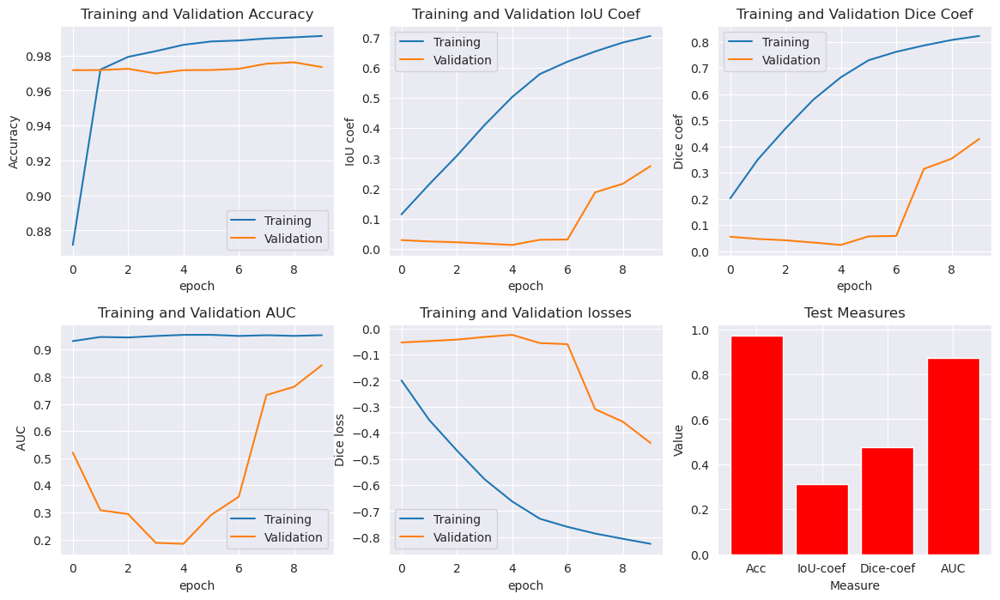

In [29]:
plt.figure(figsize=(14,8))
r=2
c=3

plt.subplot(r,c,1)
plt.plot(result.history['accuracy'])
plt.plot(result.history['val_accuracy'])
plt.legend(['Training', 'Validation'])
plt.title('Training and Validation Accuracy')
plt.xlabel('epoch')
plt.ylabel('Accuracy');

plt.subplot(r,c,2)
plt.plot(result.history['iou_coef'])
plt.plot(result.history['val_iou_coef'])
plt.legend(['Training', 'Validation'])
plt.title('Training and Validation IoU Coef')
plt.xlabel('epoch')
plt.ylabel('IoU coef');

plt.subplot(r,c,3)
plt.plot(result.history['dice_coef'])
plt.plot(result.history['val_dice_coef'])
plt.legend(['Training', 'Validation'])
plt.title('Training and Validation Dice Coef')
plt.xlabel('epoch')
plt.ylabel('Dice coef');

plt.subplot(r,c,4)
plt.plot(result.history['auc'])
plt.plot(result.history['val_auc'])
plt.legend(['Training', 'Validation'])
plt.title('Training and Validation AUC')
plt.xlabel('epoch')
plt.ylabel(' AUC')

plt.subplot(r,c,5)
plt.plot(result.history['loss'])
plt.plot(result.history['val_loss'])
plt.legend(['Training', 'Validation'])
plt.title('Training and Validation losses')
plt.xlabel('epoch')
plt.ylabel('Dice loss')
plt.subplots_adjust(hspace=0.3)

plt.subplot(r,c,6)
x = ['Acc', 'IoU-coef', 'Dice-coef', 'AUC']
y = [results[1],results[2] ,results[3],results[4]]
plt.bar(x, y, color='red')
plt.xlabel('Measure')
plt.ylabel('Value')
plt.title('Test Measures')


plt.savefig( 'seg_curves.jpg', dpi=800, bbox_inches = 'tight')

In [30]:
# prediction time starts(p0) 
p0 = time.time()

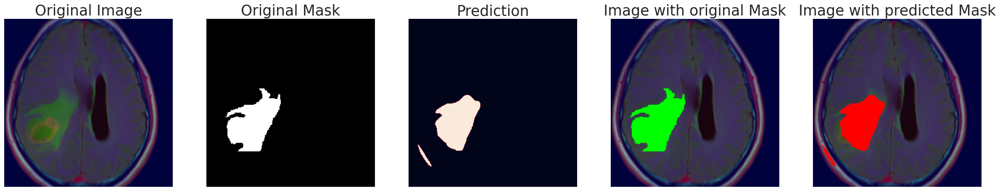

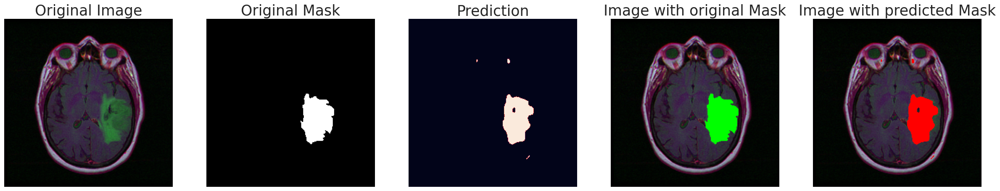

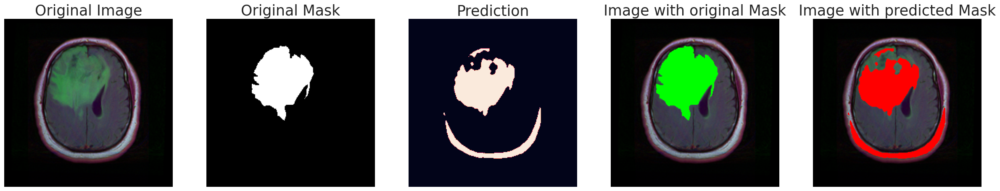

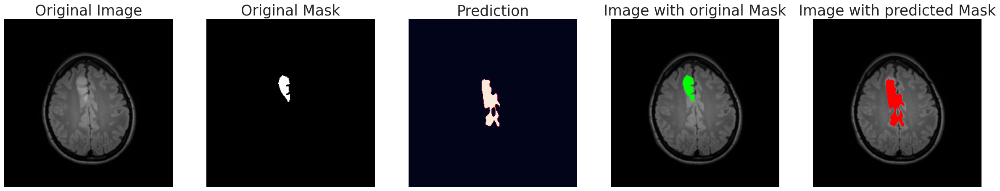

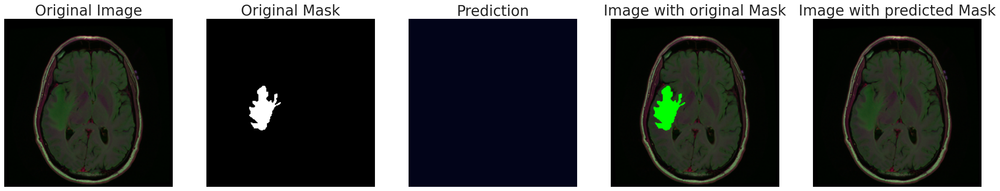

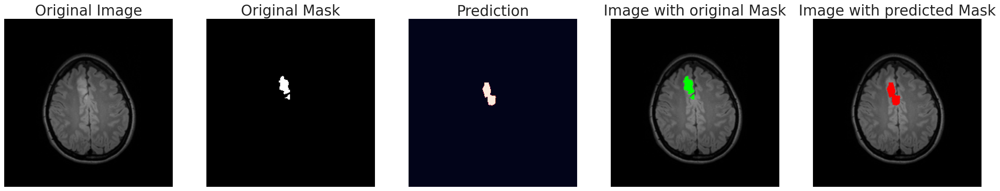

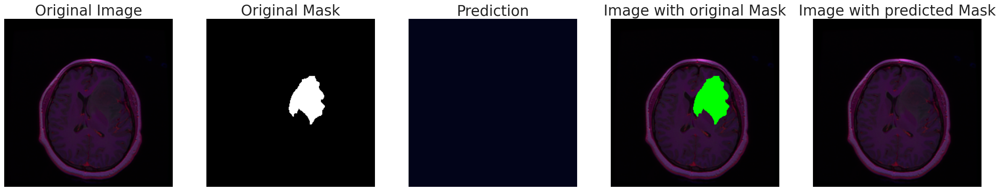

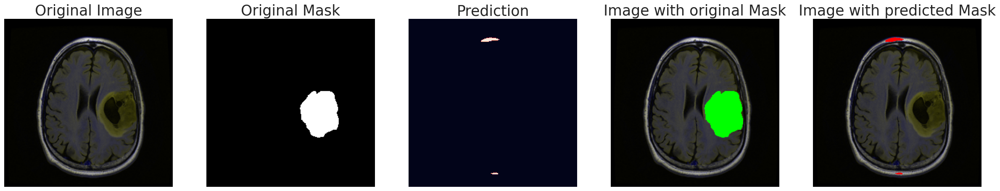

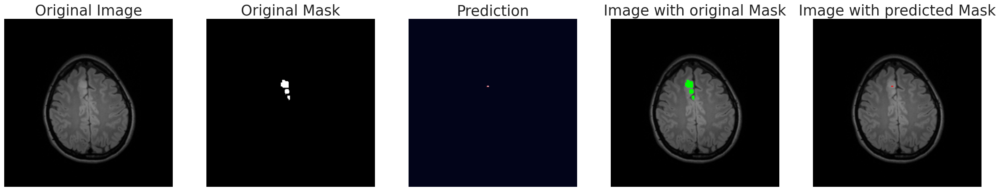

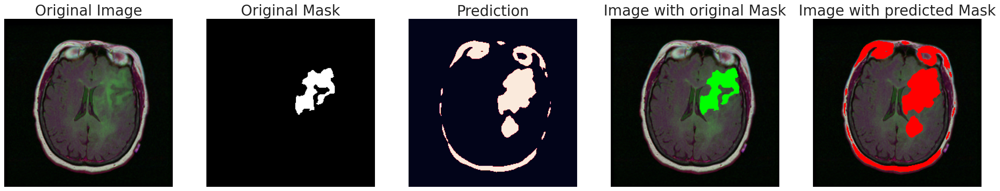

In [31]:
for _ in range(10):
    index = np.random.randint(1, len(test_df.index))
    img = cv2.imread(test_df['images_paths'].iloc[index])
    img = cv2.resize(img, (256, 256))
    img = img/255
    img = img[np.newaxis, :, :, : ]

    predicted_img = model.predict(img, verbose=0)

    plt.figure(figsize=(30, 70))
    
    plt.subplot(1, 5, 1)
    plt.imshow(np.squeeze(img))
    plt.axis('off')
    plt.title('Original Image',fontdict={'fontsize':25})

    plt.subplot(1, 5, 2)
    plt.imshow(np.squeeze(cv2.imread(test_df['masks_paths'].iloc[index])))
    plt.axis('off')
    plt.title('Original Mask',fontdict={'fontsize':25})

    plt.subplot(1, 5, 3)
    plt.imshow(np.squeeze(predicted_img) > 0.5 )
    plt.title('Prediction',fontdict={'fontsize':25})
    plt.axis('off')
    
    img1= np.squeeze(img.copy())
    omask = cv2.imread(test_df['masks_paths'].iloc[index])
    omask = cv2.cvtColor(omask,cv2.COLOR_RGB2GRAY)
    img1[omask==255] = (0,255,0)
    plt.subplot(1, 5, 4)
    plt.imshow(img1)
    plt.title('Image with original Mask',fontdict={'fontsize':25})
    plt.axis('off')
    
    img2=np.squeeze(img.copy())
    predicted_img = np.squeeze(predicted_img)
    img2[predicted_img>0.5] = (255,0,0)    
    plt.subplot(1, 5, 5)
    plt.imshow(img2)
    plt.title('Image with predicted Mask',fontdict={'fontsize':25})
    plt.axis('off')
    
    plt.show
# plt.savefig( 'preds.jpg', dpi=800, bbox_inches = 'tight')

In [32]:
# total prediction time(pt) 
p1 = time.time()
pt = p1 - p0 
print("Model prediction time ; ",pt ) 

Model prediction time ;  12.018896102905273


In [33]:
# total code wall time(cwt)
cw1 = time.time() 
cwt = cw1 - cw0 
print("Total code wall time / running time : ", cwt )

Total code wall time / running time :  464.0925261974335


In [34]:
print( 'data loading & preprocessing time' , dppt)
print( 'Model training time' , tt)
print( 'tumour predction time' , pt)
print("Total code wall time / running time : ", cwt )

data loading & preprocessing time 28.887691974639893
Model training time 394.10818123817444
tumour predction time 12.018896102905273
Total code wall time / running time :  464.0925261974335


In [35]:
from tabulate import tabulate

# Define the variables and their respective values
variables = ['Data loading & preprocessing', 'Model training', 'tumour predction', ' total code wall time']
values = [dppt, tt, pt, cwt]  # Assign the actual values to these variables

# Create a list of lists containing the variables and values
table_data = [[var, val] for var, val in zip(variables, values)]

# Specify the table headers
headers = ['Times', 'Value']

# Generate the table using tabulate
table = tabulate(table_data, headers, tablefmt='grid')

# Print the table
print(table)

+------------------------------+----------+
| Times                        |    Value |
+==============================+==========+
| Data loading & preprocessing |  28.8877 |
+------------------------------+----------+
| Model training               | 394.108  |
+------------------------------+----------+
| tumour predction             |  12.0189 |
+------------------------------+----------+
| total code wall time         | 464.093  |
+------------------------------+----------+


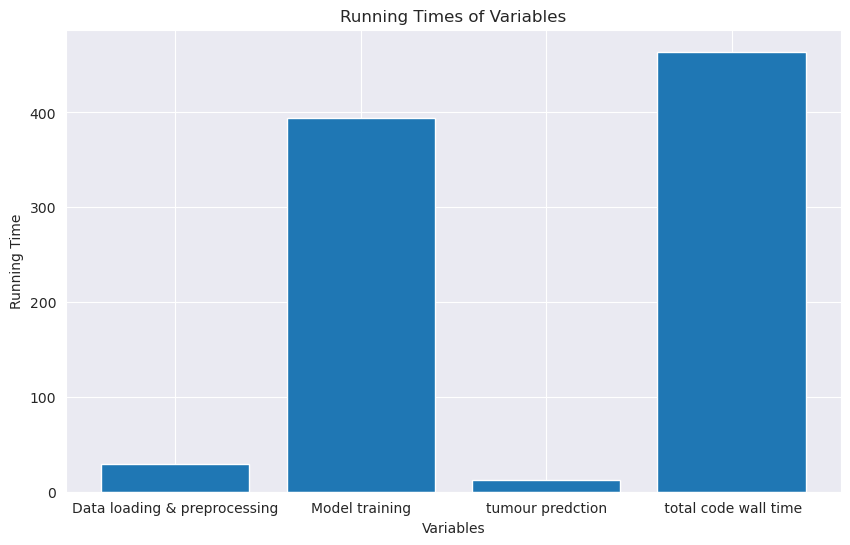

In [36]:
import matplotlib.pyplot as plt

# Create a bar chart
plt.figure(figsize=(10, 6))  # Set the figure size
plt.bar(variables, values)  # Plot the bar chart

# Add labels and title
plt.xlabel('Variables')  # X-axis label
plt.ylabel('Running Time')  # Y-axis label
plt.title('Running Times of Variables')  # Chart title

# Display the bar chart
plt.show()